In [1]:
import numpy as np
import pandas as pd
import scipy
from scipy import stats
import suncalc

import dask.dataframe as dd
from pathlib import Path
import glob
import re

import datetime as dt

import matplotlib.pyplot as plt
from matplotlib import colors
import soundfile as sf
import matplotlib.patches as patches

In [2]:
import sys

sys.path.append("../src")
sys.path.append("../src/activity")

In [3]:
import subsampling as ss
import activity_assembly as actvt
from core import SITE_NAMES, FREQ_GROUPS, SEATTLE_LATITUDE, SEATTLE_LONGITUDE

from cli import get_file_paths
import plot
import pipeline

In [4]:
def get_recover_ratios_per_bin(clength, time_on, actvt_metric):
    slots = pd.date_range(actvt_metric.index[0], actvt_metric.index[-1], freq=f'1T', inclusive='left')
    dc_scheme = pd.DataFrame(index=slots)
    num_reps =np.floor(len(slots)/clength).astype(int)
    time_ons = ([1]*time_on + [0]*(clength-time_on)) * num_reps
    remaining_mins = (len(slots) - len(time_ons))
    if remaining_mins > 0:
        if remaining_mins > time_on:
            dc_scheme['time_on'] = time_ons + ([1]*time_on + [0]*(remaining_mins-time_on))
        else:
            dc_scheme['time_on'] = time_ons + ([1]*remaining_mins)
    else:
        dc_scheme['time_on'] = time_ons

    dc_scheme_on = dc_scheme.resample('30T').sum()
    dc_scheme_on['recover_ratio'] = (30/dc_scheme_on).replace(np.inf, 0)
    return dc_scheme_on

In [5]:
def get_desired_metrics_from_activity_section(actvt_metric, data_params):
    time_ons = []
    c_lengths = []

    time_ons_per_dc = pd.DataFrame()
    high_actvt_metric = pd.DataFrame()
    for i, col_name in enumerate(data_params["dc_tags"]):
        dc_tag = col_name.split('(')[-1].split(')')[0]
        on = int(dc_tag.split('of')[0])
        total = int(dc_tag.split('of')[-1])
        bin_size = int(data_params['bin_size'])
        dc_actvt = actvt_metric[f'{data_params["metric_tag"]} ({col_name})'].copy()
        if i > 0:
            time_ons.append(on)
            c_lengths.append(total)
                
        dc_scheme_on = get_recover_ratios_per_bin(total, on, dc_actvt)
        dc_scheme_on[f'time_on ({dc_tag})'] = dc_scheme_on['time_on']
        rep_dc_actvt = dc_actvt * dc_scheme_on['recover_ratio']
        time_ons_per_dc = pd.concat([time_ons_per_dc, dc_scheme_on[f'time_on ({dc_tag})']], axis=1)
        
        standard_metric = data_params['metric_tag']
        if data_params["metric_tag"]=='num_dets':
            standard_metric = 'call_rate_per_hour'

        if total-on >= bin_size:
            high_actvt_metric[f'{standard_metric} ({col_name})'] = rep_dc_actvt.replace(np.NaN, -1).replace(0, np.NaN).ffill(limit=(min((14*60)-on, total-on)//bin_size)).replace(np.NaN, 0).replace(-1, np.NaN)
        else:
            high_actvt_metric[f'{standard_metric} ({col_name})'] = rep_dc_actvt

    high_actvt_desired_metrics = high_actvt_metric.copy()
    if (standard_metric == 'call_rate_per_hour') or (standard_metric == 'activity_indices'):
        high_actvt_desired_metrics = high_actvt_desired_metrics * (2 / 1) # #calls per bin * 2 bins per 1 hour to get calls per hour

    exp_dc_metrics = high_actvt_desired_metrics.iloc[:,1:]
    control_dc_metrics = high_actvt_desired_metrics.iloc[:,0]

    metrics = dict()
    metrics['time_ons_per_dc'] = time_ons_per_dc
    metrics['exp_metric'] = exp_dc_metrics
    metrics['control_metric'] = control_dc_metrics
    metrics['cycle_lengths'] = c_lengths

    return metrics

In [6]:
c_map = {0:'w',1:'r',2:'b',3:'g',4:'orange',5:'c',6:'pink',7:'k'}
label_map = {0:'0:00-2:00',1:'2:00-4:00',2:'4:00-6:00',3:'6:00-8:00',4:'8:00-10:00',5:'10:00-12:00',6:'12:00-14:00',7:'14:00-16:00'}
# c_map = {0:'w',1:'r',2:'b',3:'g'}
len(c_map)

8

In [7]:
avail = np.arange(0, 720, 6) + 6
reset_24 = avail[np.where((24*60 % avail) == 0)[0]]

cycle_lengths = reset_24
percent_ons = [1/6, 1/3, 1/2, 2/3]
data_params = dict()
data_params["cycle_lengths"] = cycle_lengths
data_params["percent_ons"] = percent_ons
data_params['index_time_block_in_secs'] = '5'
dc_tags = ss.get_list_of_dc_tags(data_params["cycle_lengths"], data_params["percent_ons"])

In [8]:
def plot_metric_subplot_correlation(metrics, data_params):
    plot_key = data_params['type_tag']
    if data_params['type_tag']=='':
        plot_key = 'All'
    plt.figure(figsize=(4*len(data_params["percent_ons"]), 4*len(data_params["cycle_lengths"])))
    plt.rcParams.update({'font.size':metrics['exp_metric'].shape[1]/6})
    for i in range(metrics['exp_metric'].shape[1]):
        single_col_dc_metr1 = pd.DataFrame(metrics['exp_metric'].iloc[:,i])
        dc_metr1 = pd.pivot_table(single_col_dc_metr1, index=(single_col_dc_metr1.index.time), 
                            columns=single_col_dc_metr1.index.date, 
                            values=single_col_dc_metr1.columns[0])
        dctag1 = re.search(r"\d+of\d+", single_col_dc_metr1.columns[0])[0]
        metrictag1 = (single_col_dc_metr1.columns[0]).split()[0]
        plt.suptitle(f'{metrictag1} {data_params["site_tag"]} {plot_key} {data_params["start"]} to {data_params["end"]}', 
                     fontsize=24, y=1.01, weight='bold')
        single_col_c_metr = pd.DataFrame(metrics['control_metric'])
        c_metr = pd.pivot_table(single_col_c_metr, index=(single_col_c_metr.index.time), 
                            columns=single_col_c_metr.index.date, 
                            values=single_col_c_metr.columns[0])
        plt.subplot(len(data_params["cycle_lengths"]),
                    len(data_params["percent_ons"]), i+1)
        plt.title(f'{dctag1} and continuous scheme')
        plt.plot([0, np.amax(c_metr)], [0, np.amax(c_metr)], linestyle='dashed', color='k')

        for t in range(len(c_map)):
            plt_dc = dc_metr1.iloc[(dc_metr1.shape[0]//len(c_map))*t:(dc_metr1.shape[0]//len(c_map))*(t+1)]
            plt_c = c_metr.iloc[(c_metr.shape[0]//len(c_map))*t:(c_metr.shape[0]//len(c_map))*(t+1)]
            plt.scatter(plt_c, plt_dc, facecolor=c_map[t], edgecolor='k', label=f'{label_map[t]}', s=40)

        plt.xlabel(f'Continuous Measured {metrictag1}')
        plt.xscale('log')
        plt.yscale('log')
        plt.ylabel(f'DC Measured {metrictag1}')
        plt.grid(which='both')
        plt.legend(fontsize=metrics['exp_metric'].shape[1]/10)

    plt.tight_layout()
    plt.show()

Carp LF


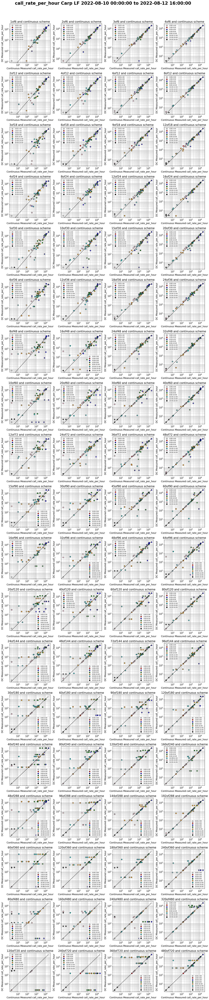

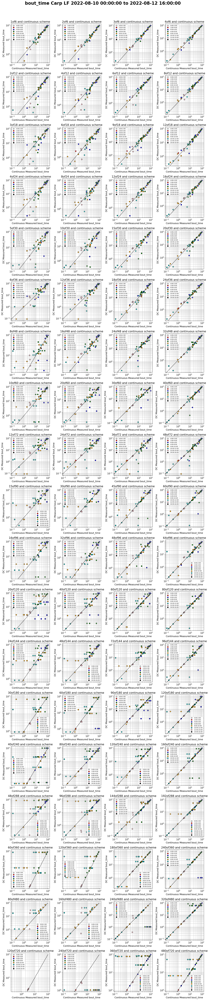

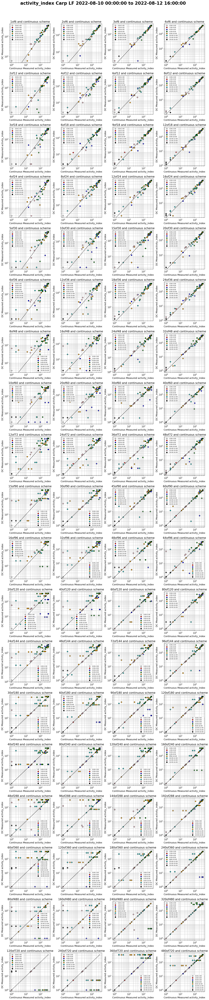

Carp HF


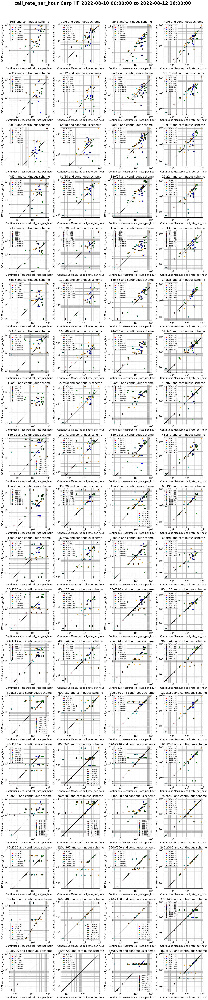

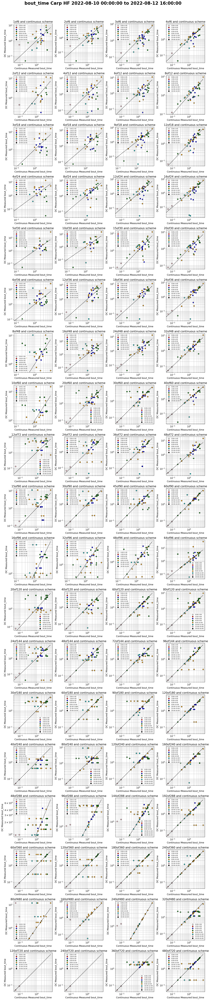

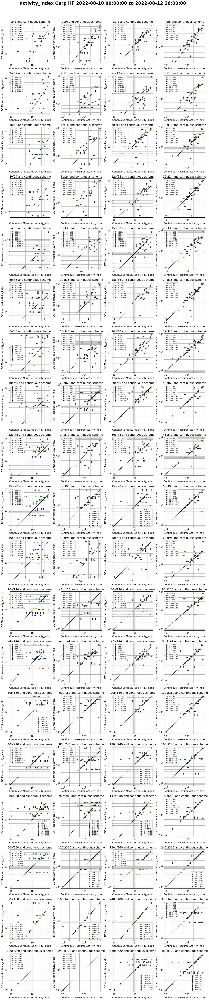

In [9]:
site_key = 'Carp'
type_keys = ['LF', 'HF']
data_params['bin_size'] = '30'
data_params["dc_tags"] = dc_tags
data_params["site_tag"] = site_key
data_params['cur_dc_tag'] = '30of30'
data_params["site_name"] = SITE_NAMES[site_key]

for type_key in type_keys:
    print(site_key, type_key)
    data_params["type_tag"] = type_key

    file_paths = get_file_paths(data_params)
    data_params['metric_tag'] = 'num_dets'
    activity_dets_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_dets_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_dets_arr.index = pd.DatetimeIndex(activity_dets_arr.index)
    data_params['start'] = dt.datetime(2022, 8, 10, 0, 0, 0)
    data_params['end'] = dt.datetime(2022, 8, 12, 16, 0, 0)
    actvt_metric = activity_dets_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_subplot_correlation(metrics, data_params)

    data_params['metric_tag'] = 'bout_time'
    activity_bout_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_bouts_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_bout_arr.index = pd.DatetimeIndex(activity_bout_arr.index)
    actvt_metric = activity_bout_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_subplot_correlation(metrics, data_params)

    data_params['metric_tag'] = 'activity_index'
    activity_inds_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_inds_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_inds_arr.index = pd.DatetimeIndex(activity_inds_arr.index)
    actvt_metric = activity_inds_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_subplot_correlation(metrics, data_params)